# Plotting

This file uses the results from `data_processing.ipynb` to plot the gravitational waves

References:  
- [1811.12907 ArXiv paper with LIGO plots](https://arxiv.org/pdf/1811.12907.pdf)
- [GWpy tutorials](https://github.com/gw-odw/odw-2020/tree/master/Day_1) [[More tutorials](https://github.com/gw-odw/odw-2020)]
- [LIGO open data workshop](https://www.gw-openscience.org/static/workshop3/)
- [GWpy signal filtering](https://gwpy.github.io/docs/stable/examples/signal/gw150914.html)
- [Own article on HackMD](https://hackmd.io/klB-AaapTLC-Ls3yiXCMdA?both)

In [141]:
from random import random

import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

In [131]:
normalized_data = pd.read_csv("normalized_ligo_data.csv", index_col=0)

In [132]:
normalized_data

,GW150914-H1,GW150914-L1,GW151012-H1,GW151012-L1,GW151226-H1,GW151226-L1,GW170104-H1,GW170104-L1,GW170608-H1,GW170608-L1,...,GW170817-L1,GW170817-V1,GW170818-L1,GW170818-V1,GW170823-H1,GW170823-L1,GW190412-H1,GW190412-L1,GW190521-H1,GW190521-L1
0,7.923464,0.302879,-2.211702,-5.339356,-0.161237,-2.410796,-3.414913,3.199464,0.031655,1.541928,...,0.332903,-8.930913,-3.243704,3.225234,2.119925,0.831548,-1.995454,-0.459244,3.727656,1.738992
1,8.948078,-1.762469,-1.696807,-4.291246,-1.552661,-1.407100,-6.700038,3.523089,0.997756,-0.438554,...,0.474699,5.994556,-4.340715,6.890621,2.041504,0.877001,-2.749641,-1.752038,3.948246,0.845805
2,5.488998,-0.347575,1.660553,-0.717499,-0.646260,-0.687835,-5.411487,1.308253,1.870551,-0.652174,...,0.404191,20.969093,-4.085395,7.351838,1.419497,0.078307,-3.098102,-1.283905,2.300905,-0.099627
3,2.801727,0.560271,3.235697,1.478241,-0.703998,0.247603,-3.680432,0.073762,3.011679,-1.055585,...,0.265933,29.949431,-3.545817,5.920226,0.802528,-0.463093,-2.348757,-1.175500,1.106801,-0.649908
4,-0.163555,2.424103,4.157239,3.736637,-0.104899,1.170969,-0.143760,-1.057561,3.919558,-1.269803,...,0.032441,30.182861,-2.188266,4.710323,0.071952,-1.068910,-1.252879,-0.513536,-0.129834,-0.926613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,-5.073133,-0.489101,0.517023,-6.224654,2.588996,0.499956,0.470540,-0.340018,-2.721649,1.415528,...,-0.046841,-1.025104,1.485138,-2.526289,-0.976049,0.615697,2.383098,2.552977,0.891952,2.385713
1496,-3.049705,0.450463,2.615842,-6.673272,4.273428,-0.514554,0.750141,-2.473510,-3.860040,3.370822,...,-0.138053,-19.473388,1.377796,-1.317519,-0.197901,0.155076,2.104028,3.095039,0.758266,2.214852
1497,-1.081780,1.809242,4.760928,-5.876048,6.101193,-1.654269,1.756970,-3.917708,-3.802362,5.322434,...,-0.175223,-31.461792,0.886431,-1.251240,0.432637,-0.342839,0.817934,3.356215,0.112529,1.879553
1498,1.469599,2.559498,5.487217,-4.490430,6.834272,-2.571450,2.035898,-3.570518,-2.738025,6.051324,...,-0.106394,-33.119947,-0.190728,-1.077161,1.007519,-0.476360,-0.735004,2.770732,-0.198201,1.564743


In [133]:
nr_points = raw_data.shape[0] # same (1500) for all data

## Plot Function

In [243]:
def ligo_joyplot(w,h, df, block_color=False, ics_factor = 20):
    # Plot Size
    plot_width = 16
    plot_height = 20
    # Fonts
    csfont = {'fontname': 'Bitstream Vera Sans Mono'} # 'Capture it'} # 
    # Dataset Parameters
    nr_of_curves = df.shape[1]
    nr_of_points = df.shape[0] # in each curve
    # Drawing Parameters
    lw_initial = 1.5 # initial line width
    # ics_factor = 20 # intercurve separation factor
    # Hacks
    last_y = [0]# initial value
    
    X = np.linspace(-1, 1, nr_points) 

    # Create new Figure with black background
    fig = plt.figure(figsize=(plot_width, plot_height), facecolor=(0,0,0,1))
    ax = plt.subplot(111, frameon=False)

    # remove grid
    ax.set_xticks([])
    ax.set_yticks([])

    for ind, event_n in enumerate(df.columns,1):

        if ind > 28: # <- skip loop over this number (used to draw only subset)
            continue

        # Small reduction of the X extents to get a cheap perspective effect
        xscale = 1 - ind / 100.
        # Same for linewidth (thicker strokes on bottom)
        mylw = lw_initial - 1*ind / (nr_of_curves)
        #print(mylw, ind)


        y = ics_factor*ind + df[event_n]

        if ind == 1:
            # something's up with the first curve.
            # this is a hack to make the width work
            ax.plot(xscale * X, y, 
                    color="w", 
                    lw=lw_initial,
                    zorder = nr_of_curves-ind)
        elif ind > 1: # and 'V1' in event_n:
            # for all other curves
            ax.plot(xscale * X, y, 
                    color = "w",
                    # color=(4*ind/nr_of_curves,0,1-3*ind/nr_of_curves,1)
                    lw=mylw,
                    zorder = nr_of_curves-ind)
        ax.text(0.73 - ind/120, np.mean(y) + 1, event_n, fontsize=int(18-ind/7), 
                color=(1,1,1,1-0.3*(ind/30)), zorder=nr_of_curves, **csfont)
        # largest zorder in the front
        if ind > 28: # <- just to fill some of them as a test
            continue
        else:
            if block_color:
                # print(ind/nr_of_curves)
                ax.fill_between(xscale * X, y, -10, zorder = nr_of_curves-ind, 
                                facecolor=(random(),random(),random(),1),  )

            else:
                ax.fill_between(xscale * X, y, -10, zorder = nr_of_curves-ind, facecolor=(0,0,0,1),  )

    plt.show()
    # fig.savefig('plot.png', dpi=300)

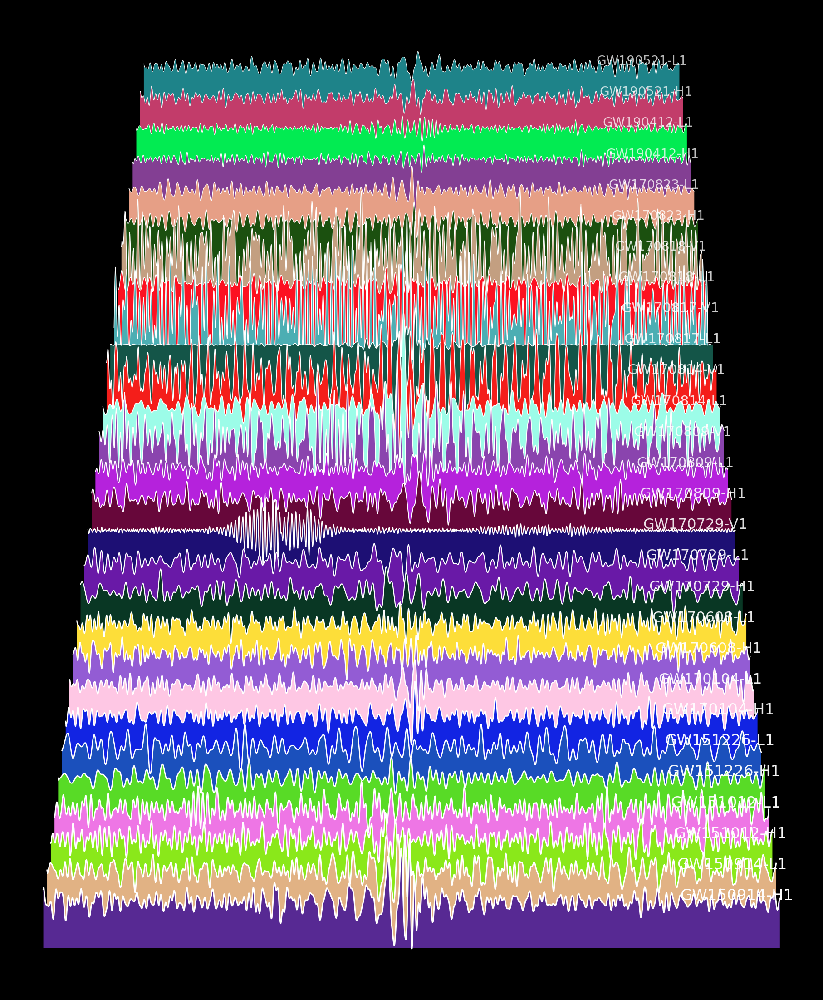

In [147]:
ligo_joyplot(16, 20, normalized_data, block_color=True)

In [148]:
# here you can check the directory containing the list of fonts available to matplotlib
import matplotlib
matplotlib.get_cachedir() 

'/home/drf/.cache/matplotlib'

## Plot of single events with up / down ramps

In [149]:
def plot_event(dataframe, event_name, scale_factor=1, 
               ramp_up_height = 0.26, ramp_up_factor = 20, 
               ramp_down_center=850, ramp_down_speed=20, 
               nr_points=1500):
    '''
    plot two copies of the event
    - the standard one 
    - a scaled one with a gaussian filter applied
    :dataframe df: pandas dataframe with event time-series data
    :event_name str: event name with lab: format GW150914-H1
    :scale_factor float: vertical scaling (for graphs too big or small)
    :ramp_down_center int: point(out of 1500) where the down_ramp starts
    :gauss_std: standard deviation of the gaussian 
    '''
    fig, ax = plt.subplots(2, figsize=(16, 9), facecolor=(0,0,0,1), frameon=False)
    # fig.tight_layout(pad=1.0)

    # first graph. Data as is:
    ax[0].plot(dataframe[event_name], color='w')
    ax[0].plot(40*np.ones(nr_points), color='r')
    ax[0].plot(-40*np.ones(nr_points), color='r')
    
    # second graph. Filtered Data
    X = np.linspace(-1, 1, nr_points) 
    
    # ramp down
    ramp_down = np.exp(-ramp_down_speed*(X-ramp_down_center/nr_points+1/2)) # 1/(100*X)
    ramp_down = np.where(ramp_down > 1, 1, ramp_down)
    
    # ramp up
    ramp_up = ramp_up_height  + 1/ramp_up_factor*(X+2.1)**4
    ramp_up = np.where(ramp_up > 1, 1, ramp_up)
    
    data_n_cos = dataframe[event_name].copy()
    for ind, x in enumerate(data_n_cos):
        if ind < 380:
            data_n_cos[ind] += 10*np.cos(ind/10) # + data_n_cos[ind]
        else:
            continue
    
    y_event = scale_factor*ramp_up*ramp_down*dataframe[event_name]
    ax[1].plot(y_event, color='w')
    # ax[1].plot(scale_factor*ramp_down*ramp_up*data_n_cos, color='w')
    ax[1].plot(30*ramp_down, color='y', lw=0.7)
    ax[1].plot(30*ramp_up, color='y', lw=0.7)
    ax[1].plot(40*np.ones(nr_points), color='r')
    ax[1].plot(-40*np.ones(nr_points), color='r')
    # ax[1].plot(30*np.cos(100*X))
    
    # remove grid
    for i in [0,1]:
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].title.set_text(event_name)
        # ax[i].axis('off')
        ax[i].set_facecolor((0,0,0,1)) 
    return event_name, y_event

# Graphs, handcrafted with ❤

Below we apply filters to better reflext the expectations of numerical relativity.  Here we depart from Science & Data Processing and into a more artistic endeavour

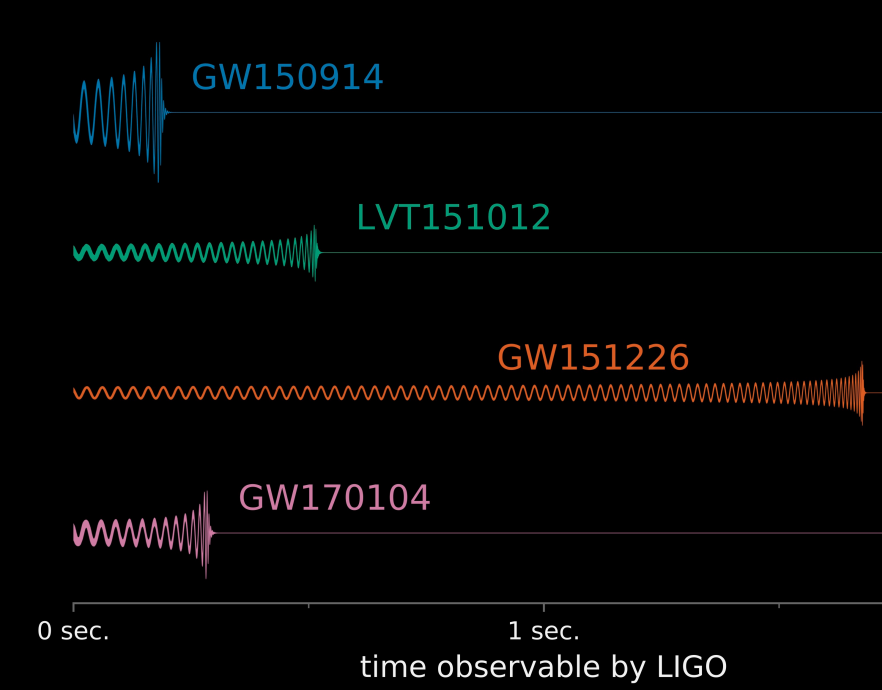

In [150]:
really_really_this_one_is_final = {}

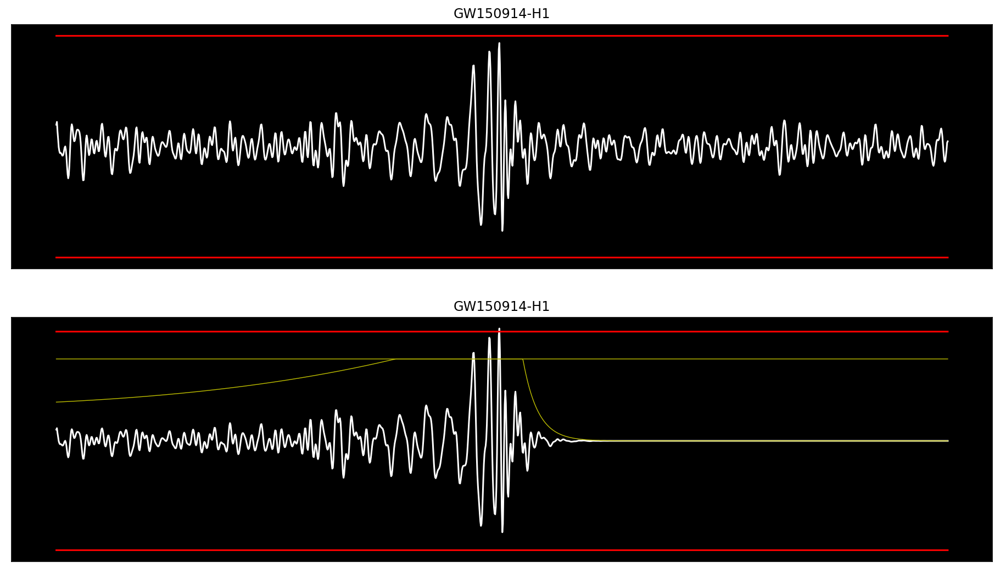

In [151]:
i=0
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.1, 
                   ramp_up_height = 0.4, ramp_up_factor = 20, 
                   ramp_down_center=820, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

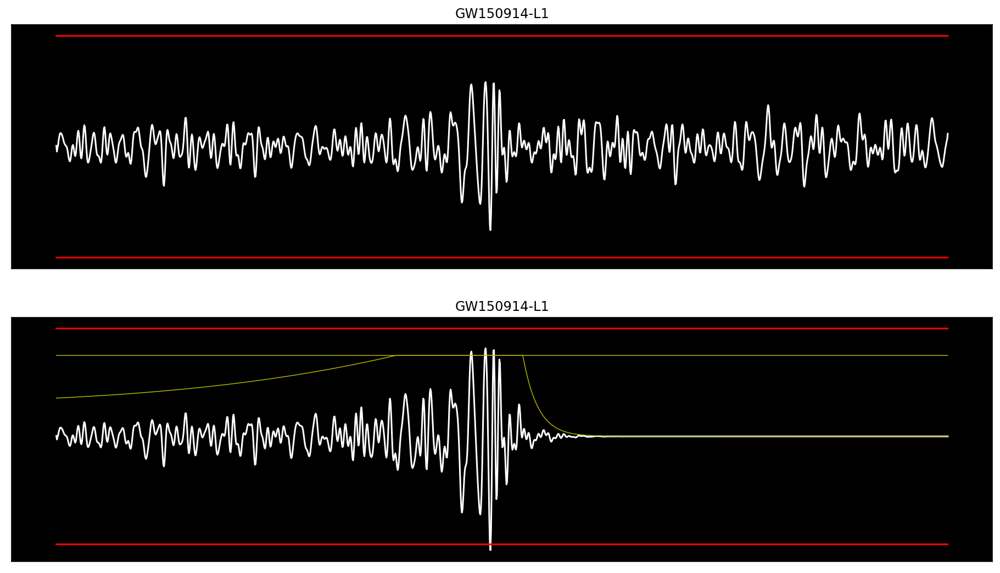

In [152]:
i=1
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.4, 
                   ramp_up_height = 0.4, ramp_up_factor = 20, 
                   ramp_down_center=820, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

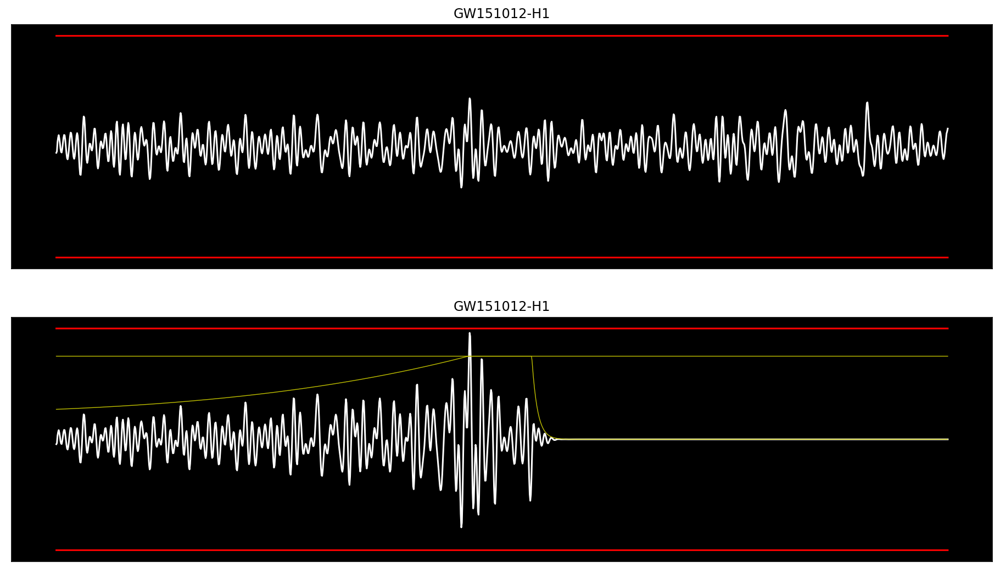

In [153]:
i=2
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.2, 
                   ramp_up_height = 0.3, ramp_up_factor = 24, 
                   ramp_down_center=850, ramp_down_speed=80)
really_really_this_one_is_final[ev_name] = y

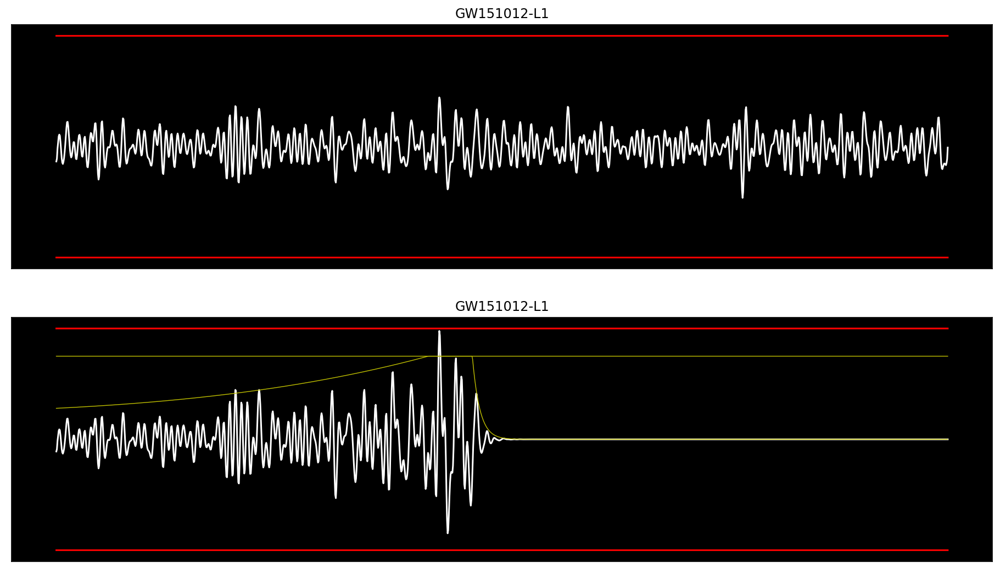

In [154]:
i=3
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.2, 
                   ramp_up_height = 0.3, ramp_up_factor = 20, 
                   ramp_down_center=650, ramp_down_speed=60)
really_really_this_one_is_final[ev_name] = y

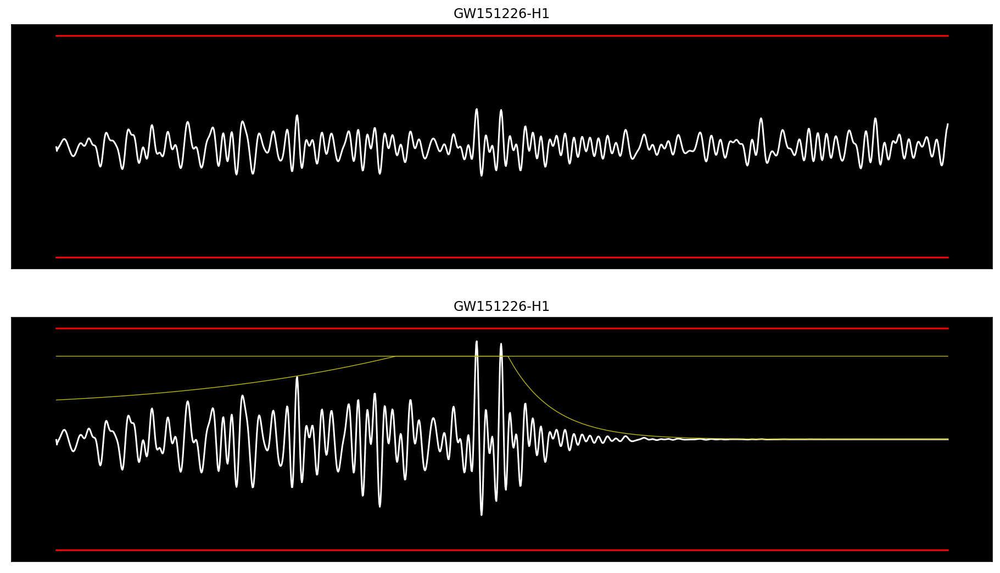

In [155]:
i=4
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.6, 
                   ramp_up_height = 0.4, ramp_up_factor = 20, 
                   ramp_down_center=770, ramp_down_speed=10)
really_really_this_one_is_final[ev_name] = y

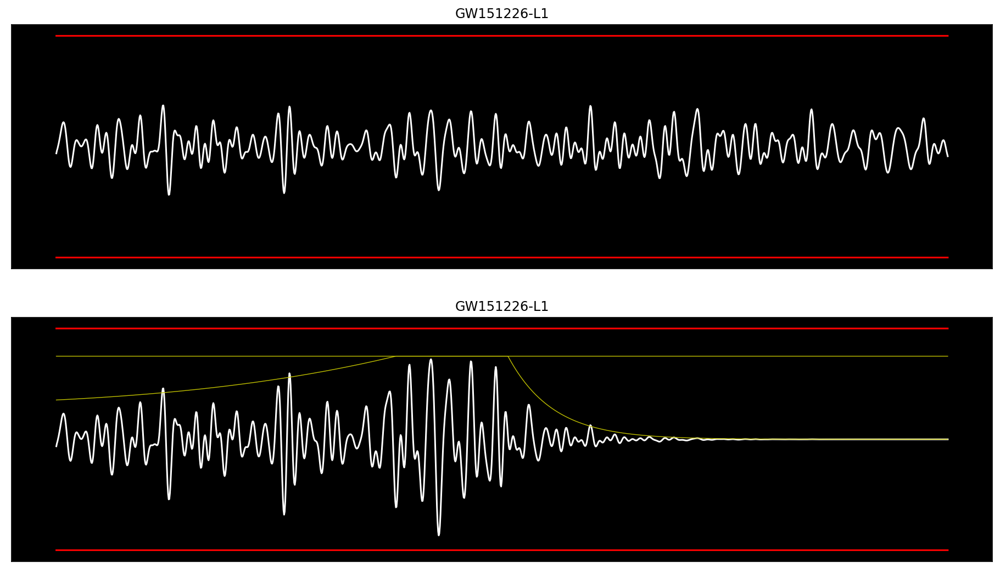

In [156]:
i=5
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.2, 
                   ramp_up_height = 0.4, ramp_up_factor = 20, 
                   ramp_down_center=770, ramp_down_speed=10)
really_really_this_one_is_final[ev_name] = y

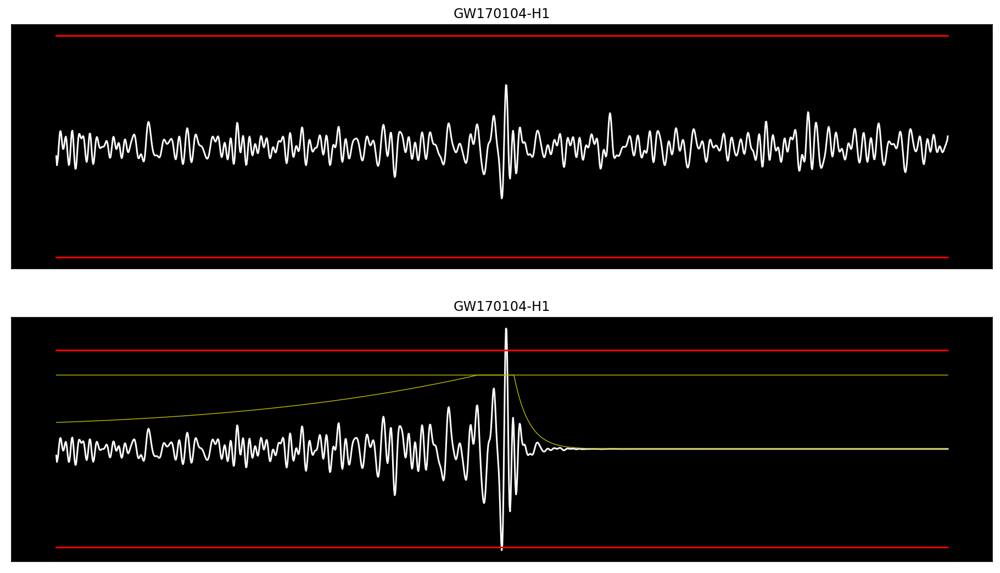

In [157]:
i=6
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.2, 
                   ramp_up_height = 0.3, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

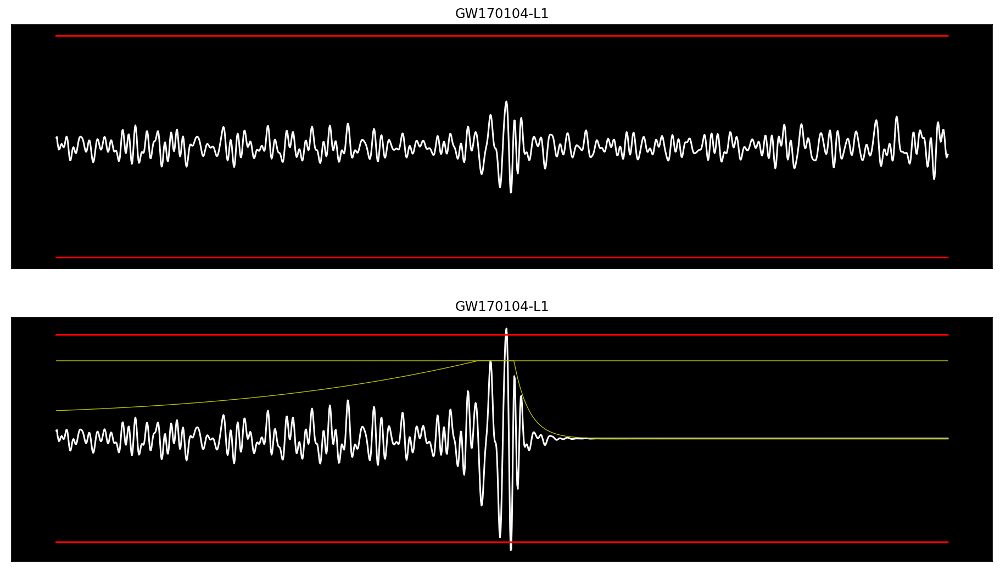

In [158]:
i=7
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.6, 
                   ramp_up_height = 0.3, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

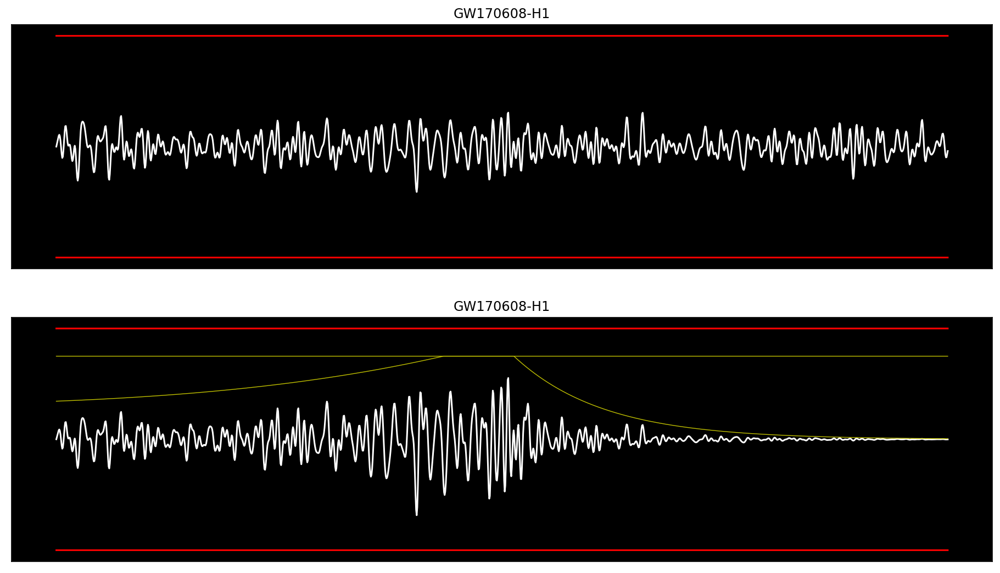

In [160]:
i=8
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.8, 
                   ramp_up_height = 0.4, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=5)
really_really_this_one_is_final[ev_name] = y

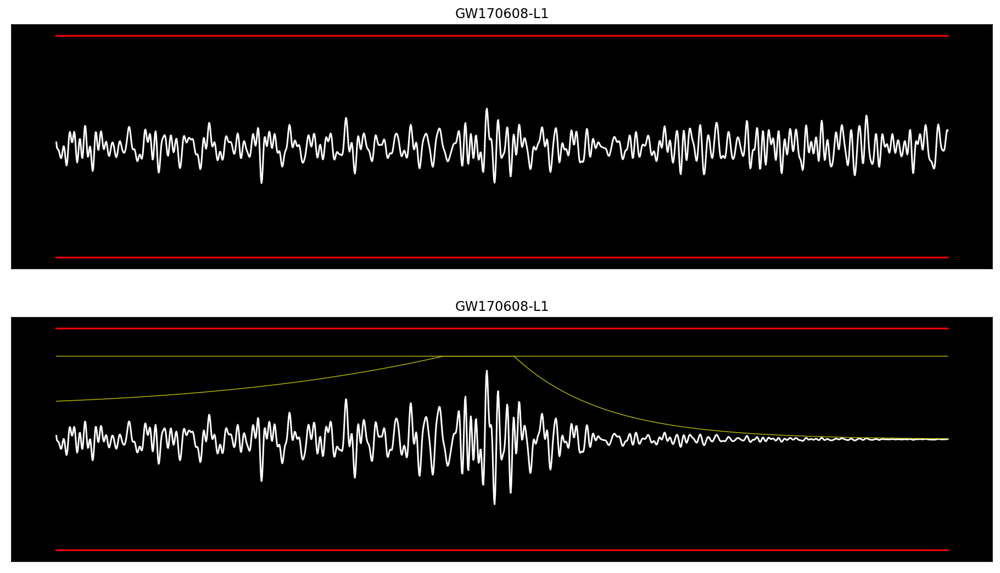

In [161]:
i=9
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.8, 
                   ramp_up_height = 0.4, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=5)
really_really_this_one_is_final[ev_name] = y

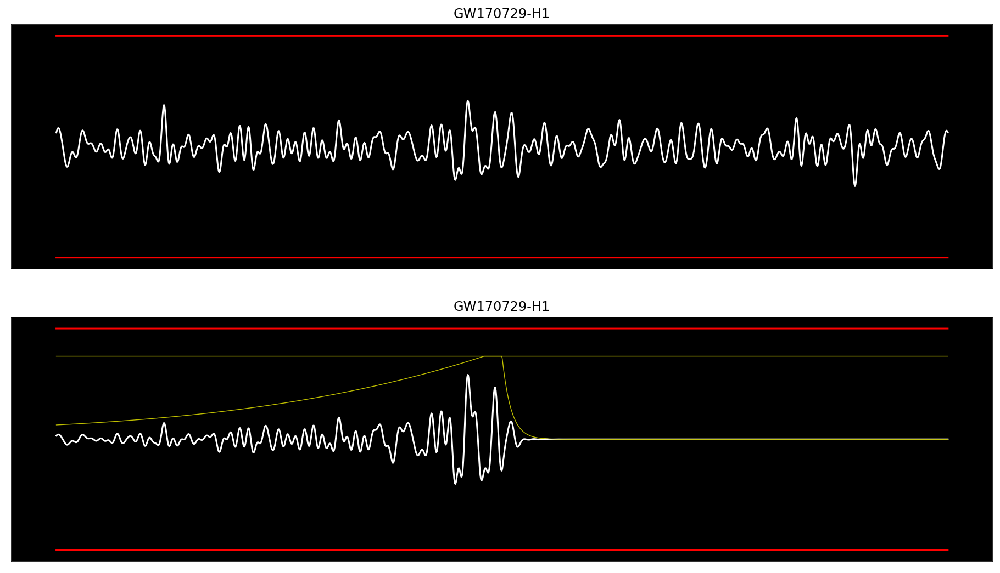

In [162]:
i=10
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.5, 
                   ramp_up_height = 0.1, ramp_up_factor = 20, 
                   ramp_down_center=750, ramp_down_speed=50)
really_really_this_one_is_final[ev_name] = y

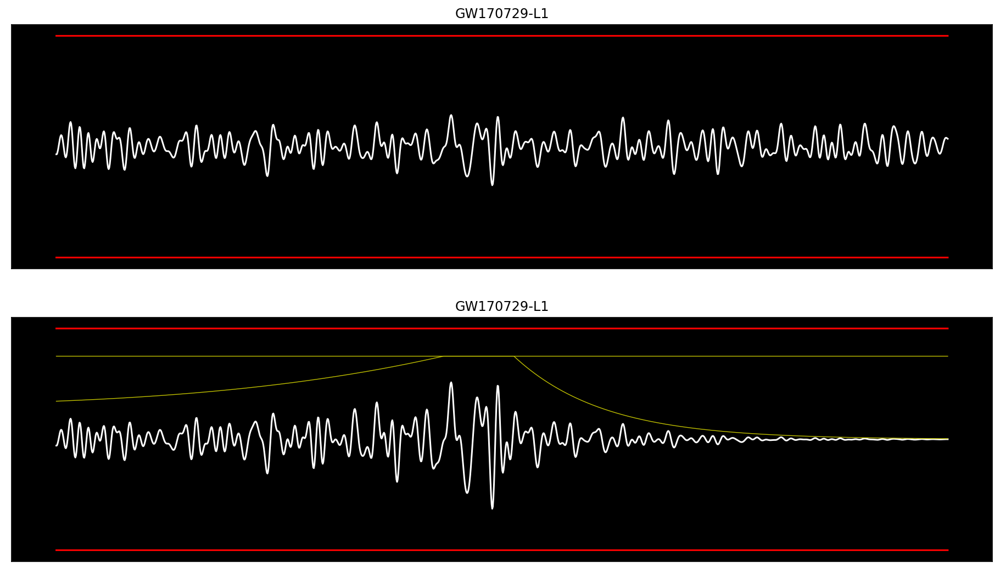

In [163]:
i=11
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.8, 
                   ramp_up_height = 0.4, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=5)
really_really_this_one_is_final[ev_name] = y

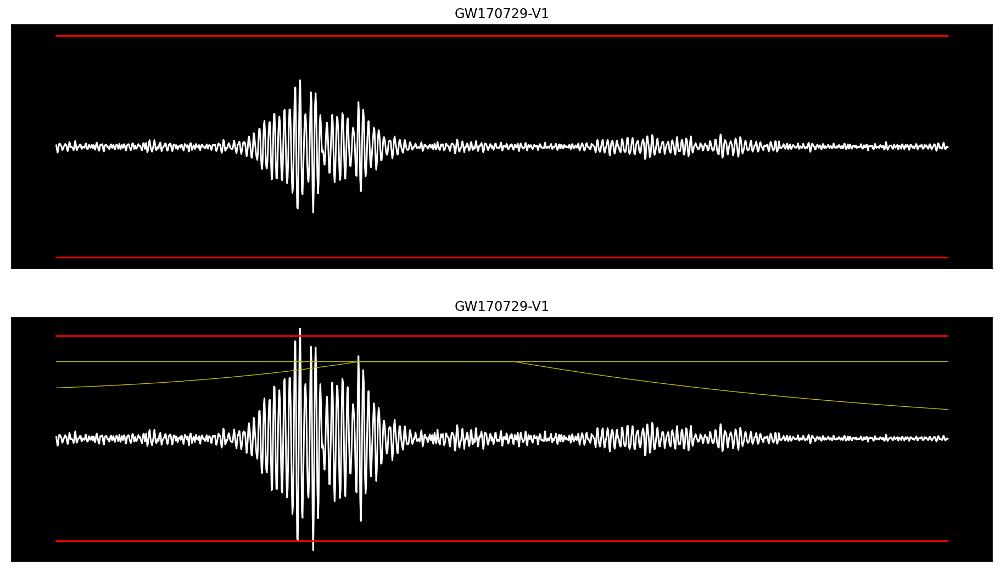

In [164]:
i=12
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2, 
                   ramp_up_height = 0.6, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=1)
really_really_this_one_is_final[ev_name] = y

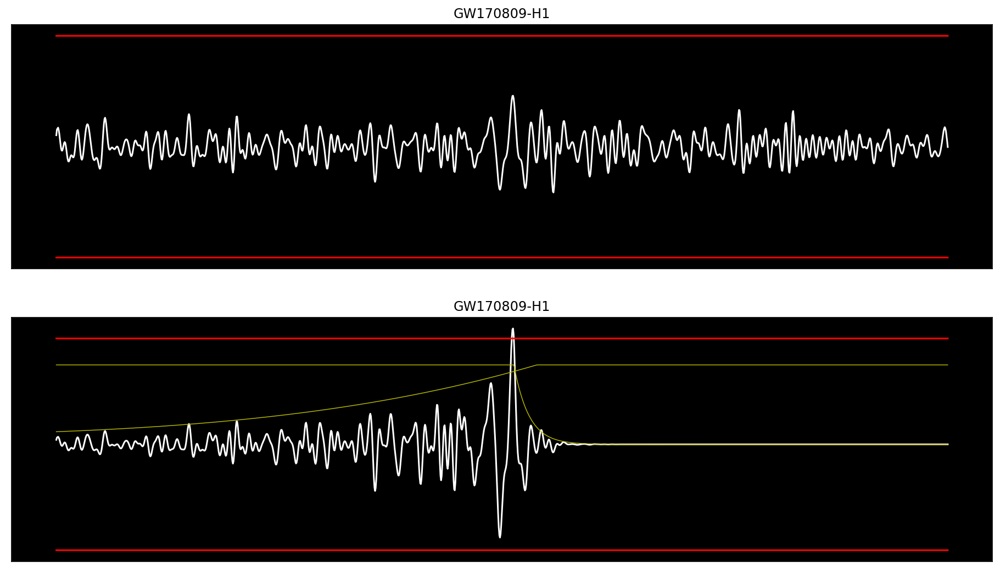

In [165]:
i=13
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.6, 
                   ramp_up_height = 0.1, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

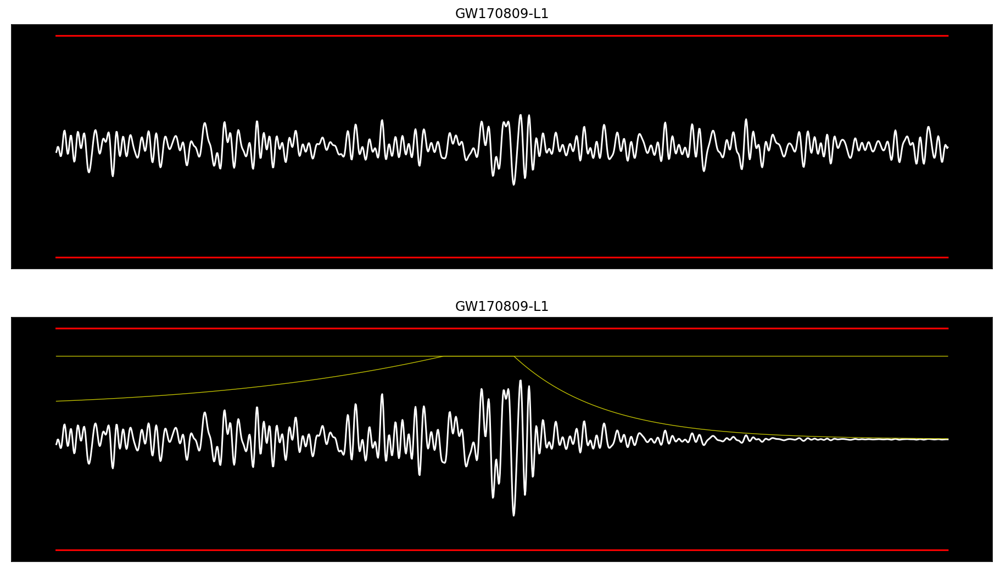

In [166]:
i=14
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2, 
                   ramp_up_height = 0.4, ramp_up_factor = 25, 
                   ramp_down_center=790, ramp_down_speed=5)
really_really_this_one_is_final[ev_name] = y

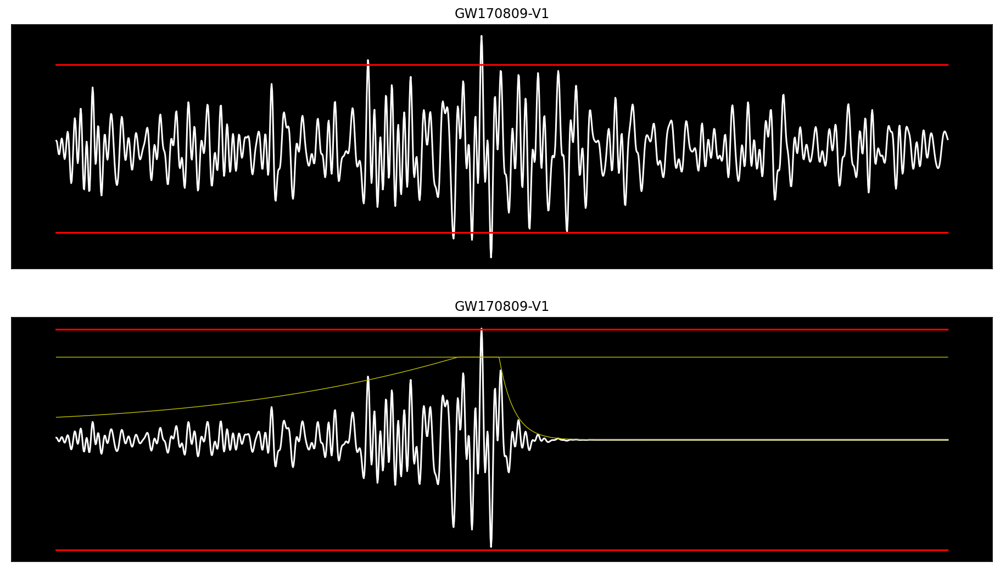

In [167]:
i=15
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 0.75, 
                   ramp_up_height = 0.2, ramp_up_factor = 20, 
                   ramp_down_center=740, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

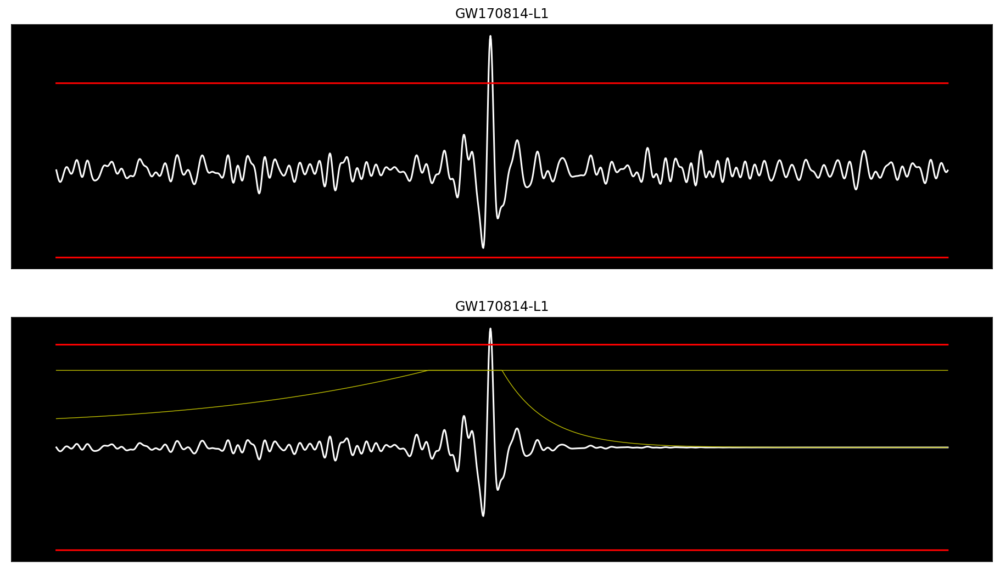

In [168]:
i=16
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 0.75, 
                   ramp_up_height = 0.3, ramp_up_factor = 20, 
                   ramp_down_center=750, ramp_down_speed=10)
really_really_this_one_is_final[ev_name] = y

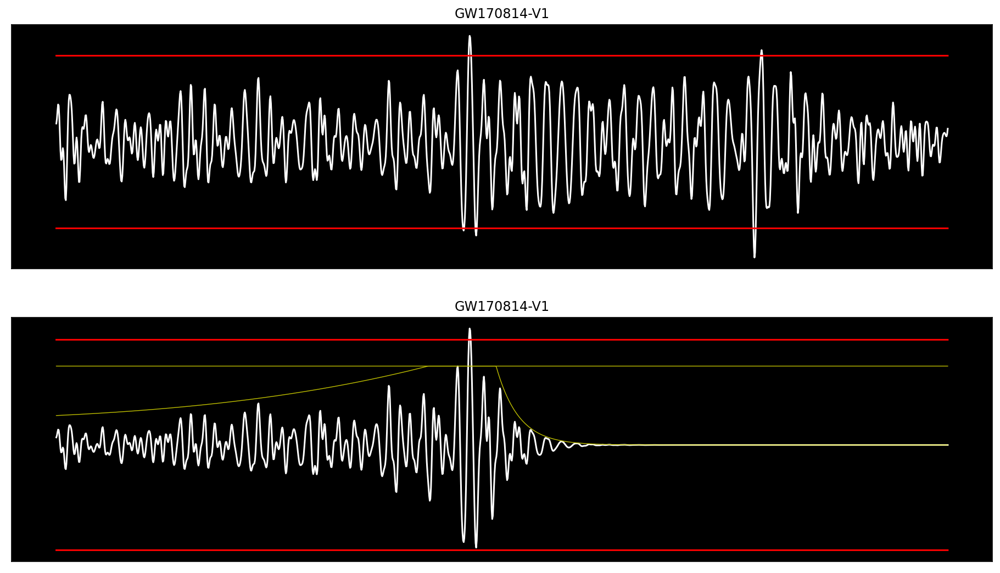

In [169]:
i=17
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 0.9, 
                   ramp_up_height = 0.3, ramp_up_factor = 20, 
                   ramp_down_center=730, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

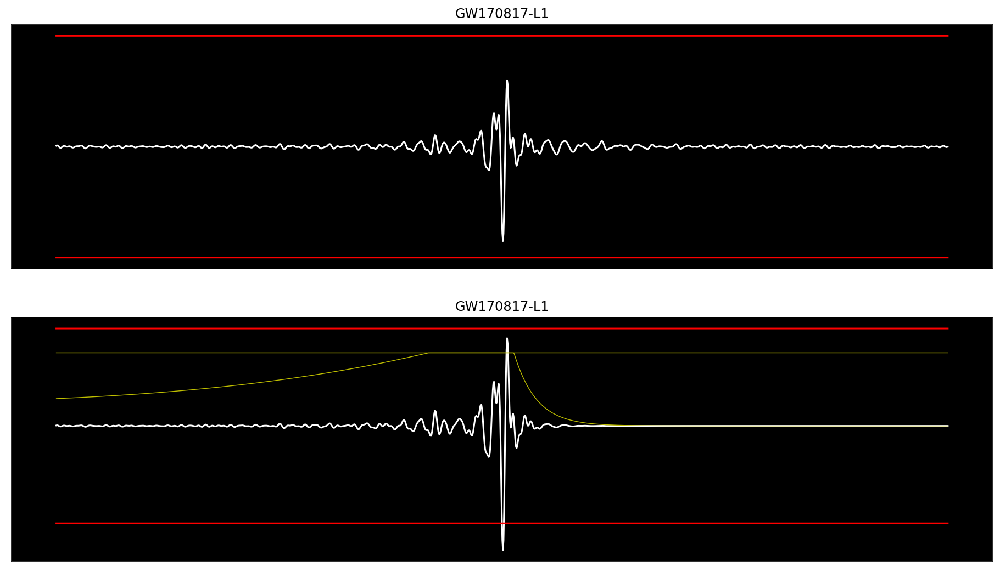

In [170]:
i=18
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 1.5, 
                   ramp_up_height = 0.3, ramp_up_factor = 20, 
                   ramp_down_center=790, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

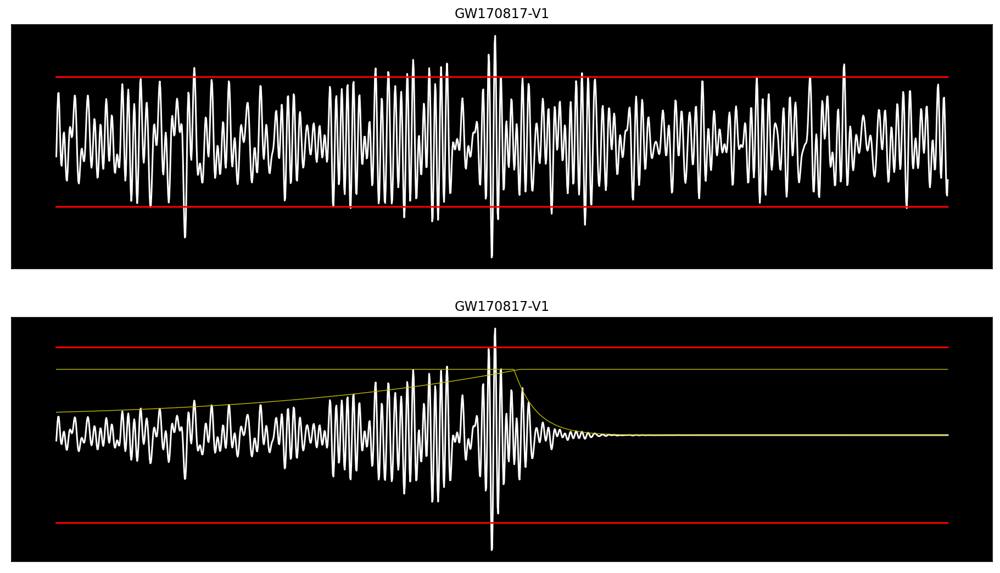

In [171]:
i=19
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 0.8, 
                   ramp_up_height = 0.3, ramp_up_factor = 30, 
                   ramp_down_center=790, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

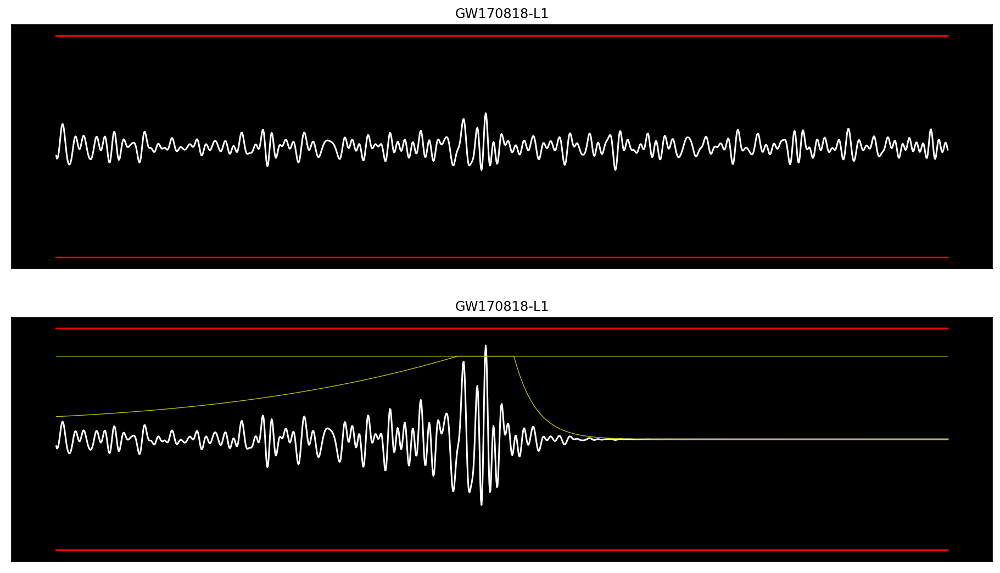

In [172]:
i=20
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.2, ramp_up_factor = 20, 
                   ramp_down_center=790, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

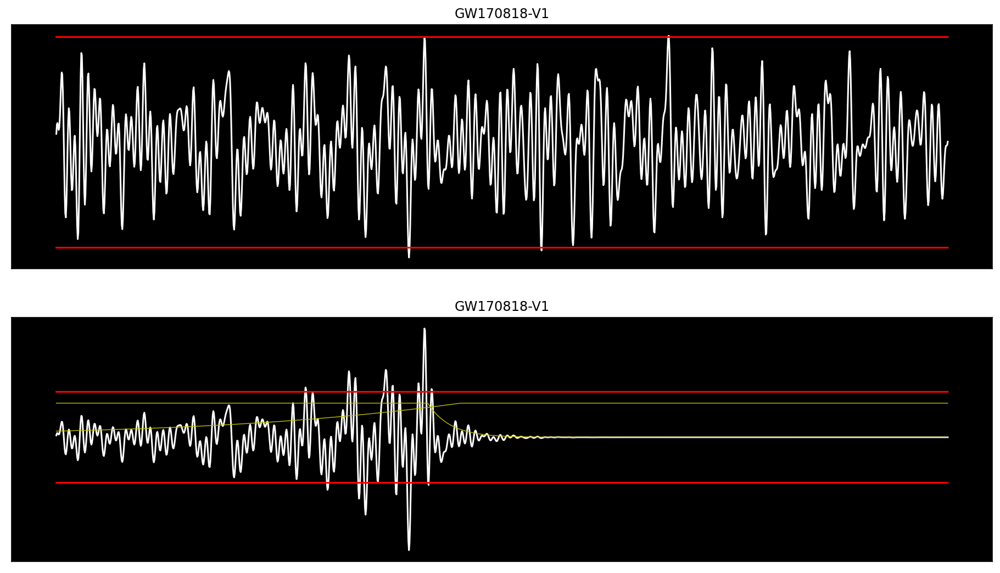

In [173]:
i=21
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.1, ramp_up_factor = 18, 
                   ramp_down_center=500, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

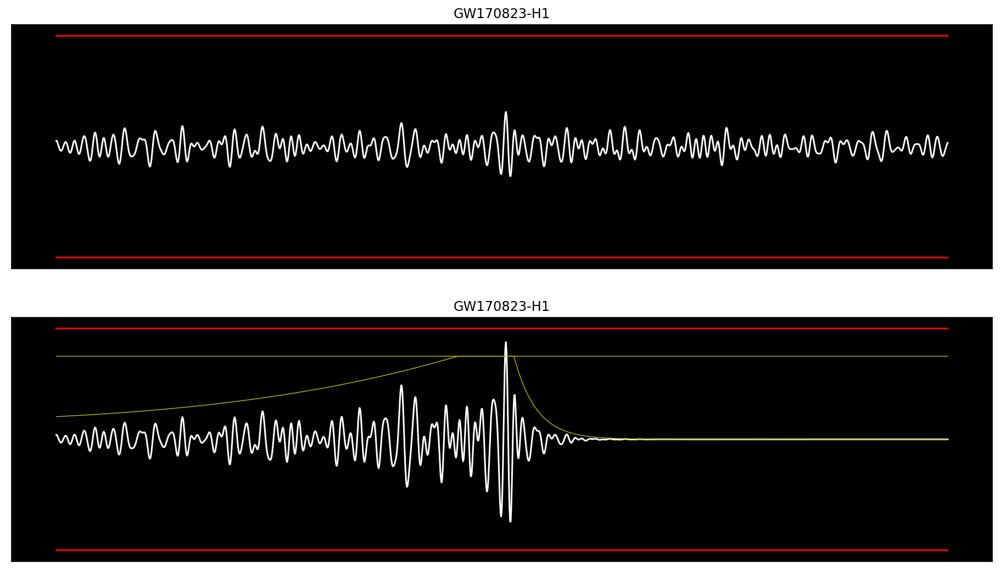

In [174]:
i=22
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.2, ramp_up_factor = 20, 
                   ramp_down_center=790, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

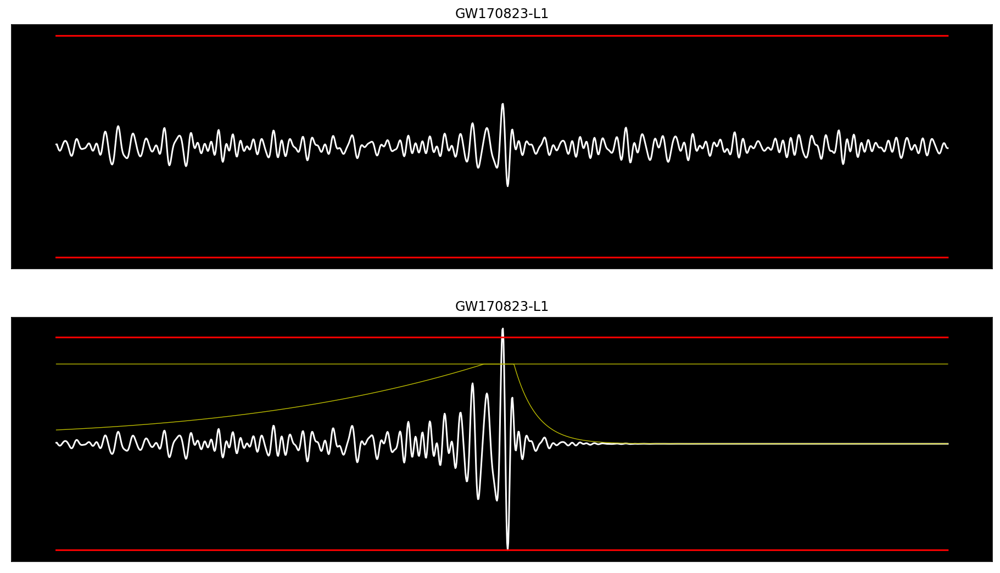

In [175]:
i=23
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.1, ramp_up_factor = 20, 
                   ramp_down_center=790, ramp_down_speed=20)
really_really_this_one_is_final[ev_name] = y

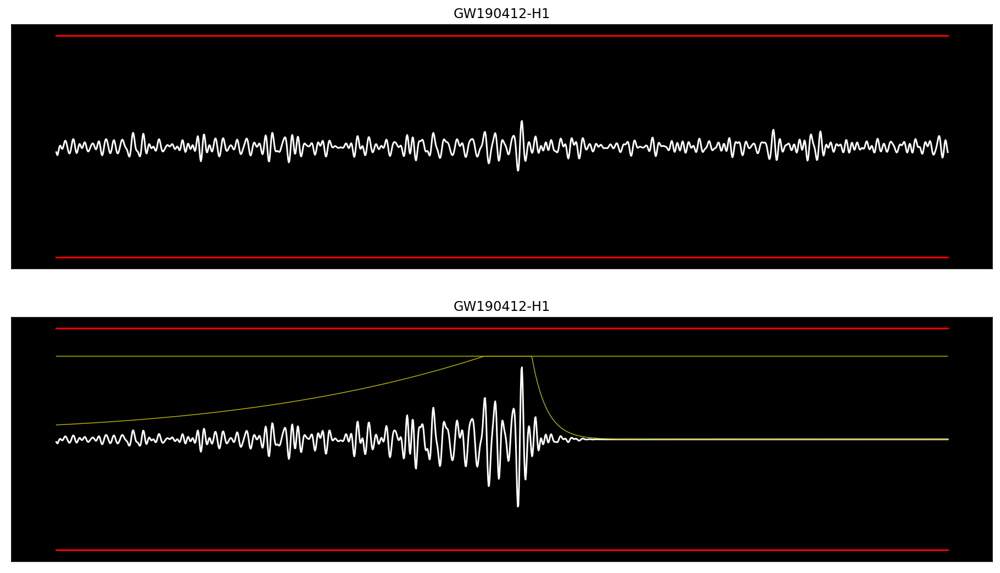

In [176]:
i=24
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.1, ramp_up_factor = 20, 
                   ramp_down_center=850, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

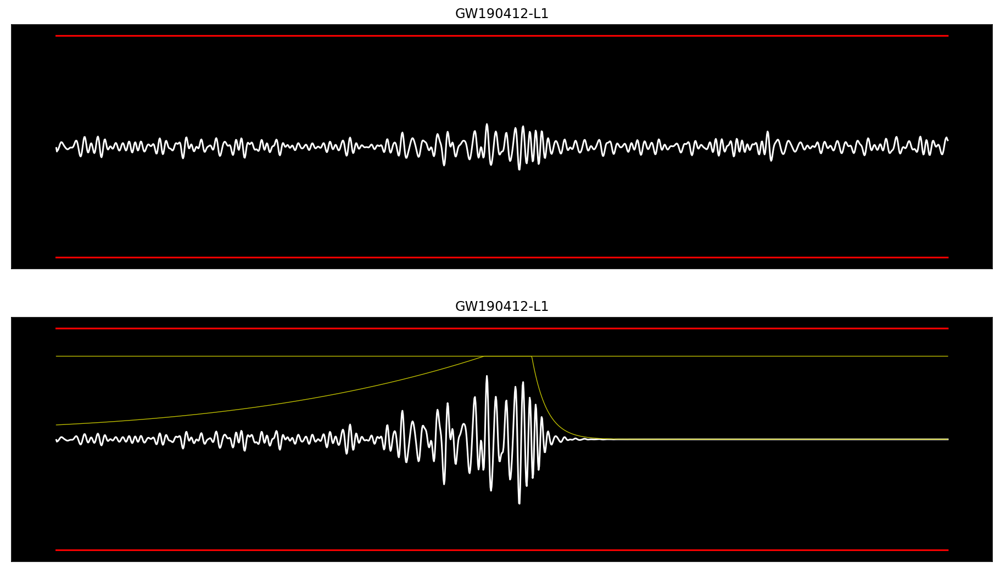

In [177]:
i=25
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.1, ramp_up_factor = 20, 
                   ramp_down_center=850, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

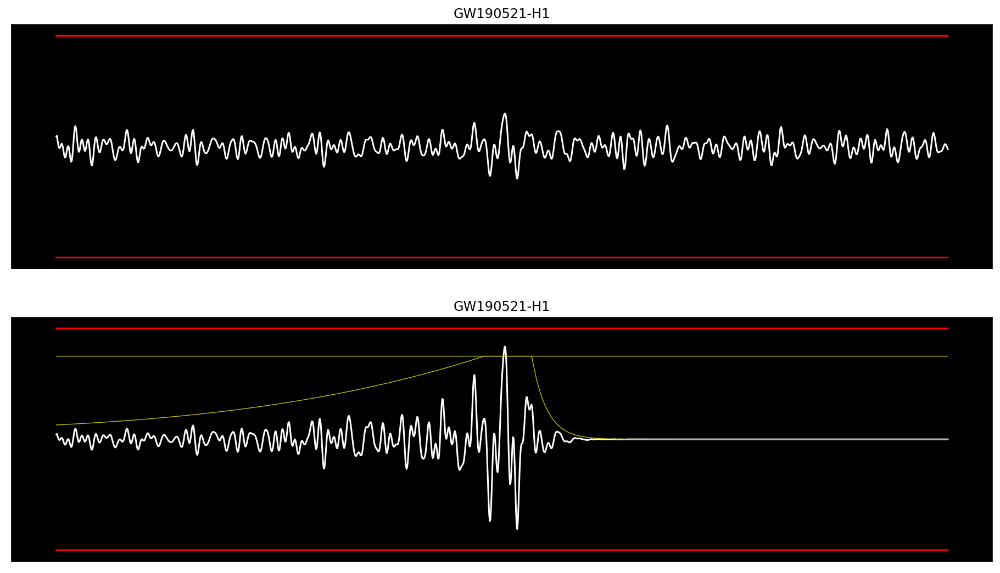

In [178]:
i=26
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.1, ramp_up_factor = 20, 
                   ramp_down_center=850, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

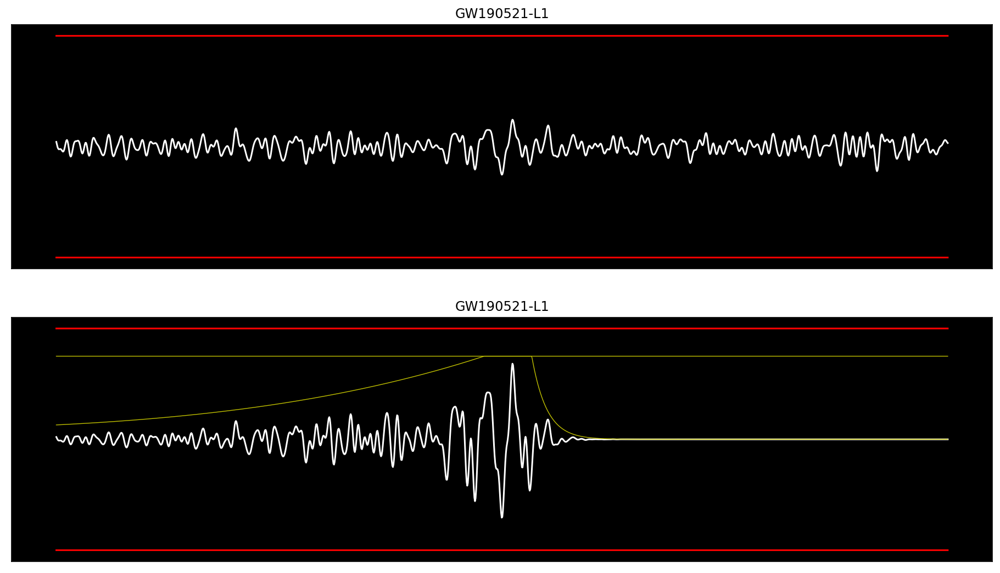

In [179]:
i=27
ev_name = normalized_data.columns[i]
na, y = plot_event(normalized_data, ev_name, 2.8, 
                   ramp_up_height = 0.1, ramp_up_factor = 20, 
                   ramp_down_center=850, ramp_down_speed=30)
really_really_this_one_is_final[ev_name] = y

# Plotting the graphs crafted with ❤

In [180]:
# fdf: final dataframe
fdf = pd.DataFrame(really_really_this_one_is_final)

# Save dataframe to CSV
from datetime import date
td = date.today()
fdf.to_csv(str(td) + "-final_graph.csv")

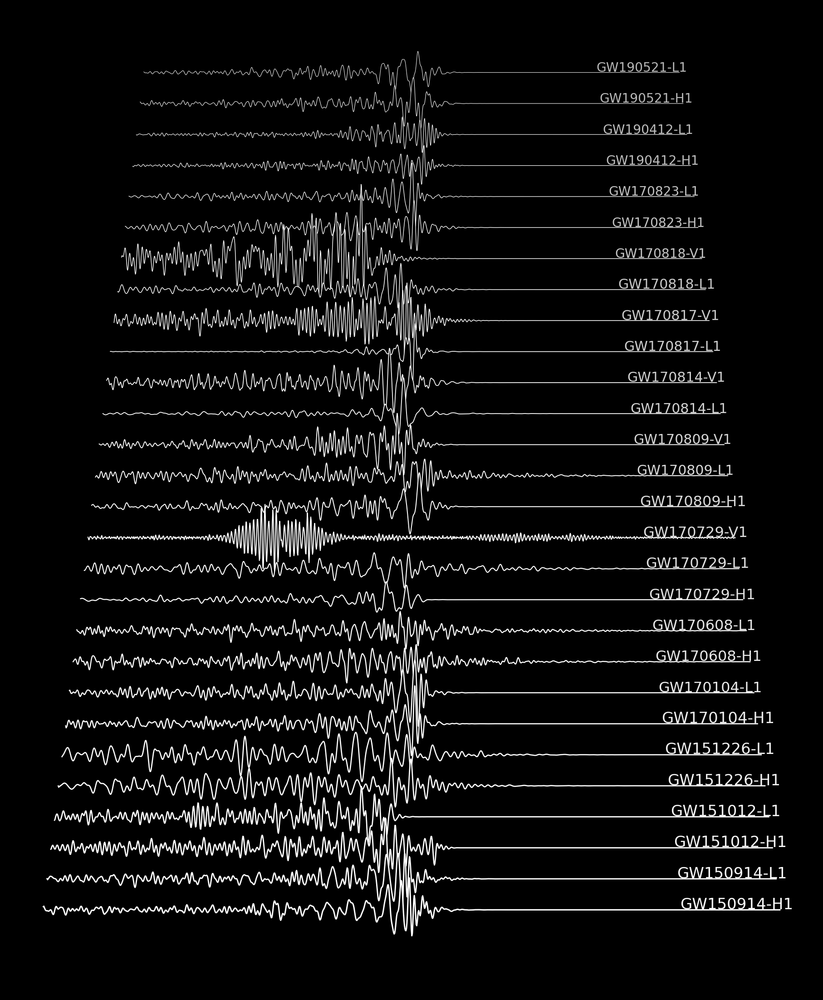

In [245]:
ligo_joyplot(16,20, fdf, block_color=False, ics_factor=40)

# Reorder & Shifting

- Can we re-order the dataframe so that we get less blocking and we can see the collisions better?
- Can we shift some graphs to the right to better see the collision?

In [236]:
# shifted dataframe
sdf = fdf.copy()

In [237]:
def shift_dfc_left(df, column_name, shift_by=500):
    '''
    shifts column_name in the dataframe df
    by "shift_by" points (note the column is 1500 points long)
    '''
    xxx = list(df[column_name].loc[shift_by:(shift_by+1000)])
    df[column_name].loc[0:1000] = xxx
    df[1000:1500] = 0
    return df

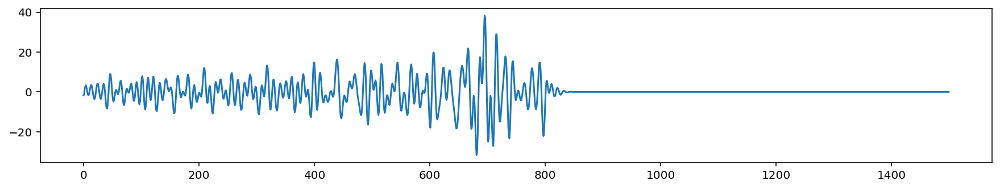

In [238]:
plt.figure(figsize=(15,2.5))
plt.plot(sdf["GW151012-H1"])

In [239]:
shift_dfc_left(sdf, "GW151012-H1", shift_by=300)

,GW150914-H1,GW150914-L1,GW151012-H1,GW151012-L1,GW151226-H1,GW151226-L1,GW170104-H1,GW170104-L1,GW170608-H1,GW170608-L1,...,GW170817-L1,GW170817-V1,GW170818-L1,GW170818-V1,GW170823-H1,GW170823-L1,GW190412-H1,GW190412-L1,GW190521-H1,GW190521-L1
0,4.124365,0.200653,-0.187415,-4.383884,-0.198375,-2.509762,-2.693823,2.982753,0.026129,1.272731,...,0.186362,-2.492106,-2.481349,1.637609,1.621688,0.403279,-0.967743,-0.222721,1.807816,0.843366
1,4.661205,-1.168490,-4.027010,-3.526691,-1.911727,-1.465964,-5.289459,3.287065,0.824074,-0.362214,...,0.265994,1.673874,-3.324859,3.506333,1.563731,0.426196,-1.336244,-0.851439,1.918730,0.411036
2,2.861468,-0.230611,-8.017565,-0.590229,-0.796313,-0.717150,-4.275592,1.221580,1.545902,-0.538984,...,0.226701,5.859245,-3.133376,3.749194,1.088712,0.038133,-1.508683,-0.625224,1.120472,-0.048515
3,1.461672,0.372013,-10.746652,1.217196,-0.868113,0.258351,-2.910214,0.068930,2.490532,-0.872924,...,0.149299,8.374282,-2.723095,3.025720,0.616320,-0.225977,-1.146132,-0.573613,0.540090,-0.317138
4,-0.085392,1.610793,-11.223969,3.079734,-0.129451,1.222725,-0.113766,-0.989077,3.243340,-1.050731,...,0.018230,8.445342,-1.682735,2.412632,0.055330,-0.522677,-0.612634,-0.251109,-0.063486,-0.453096
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1496,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1497,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1498,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


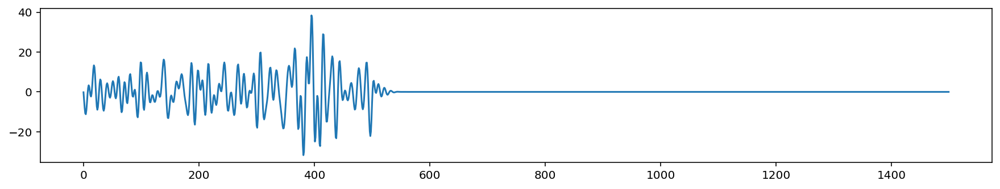

In [240]:
plt.figure(figsize=(15,2.5))
plt.plot(sdf["GW151012-H1"])

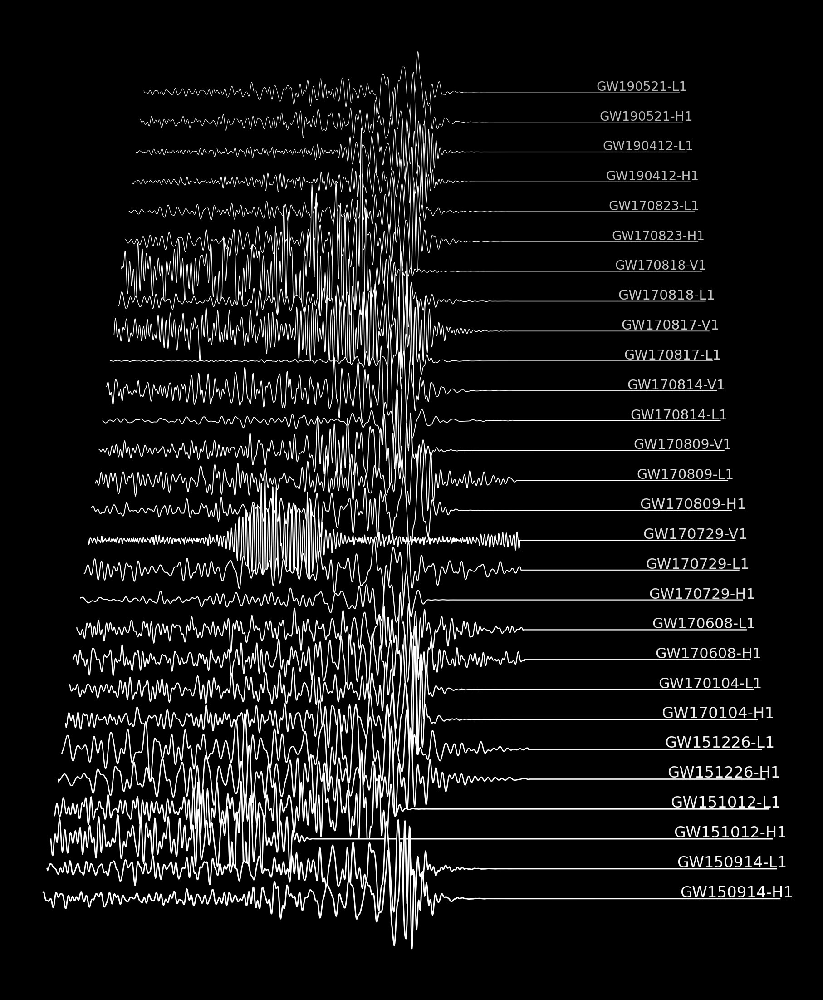

In [242]:
ligo_joyplot(16,20, sdf, block_color=False)

## Ideas

for some versions of the t-shirts, keep 

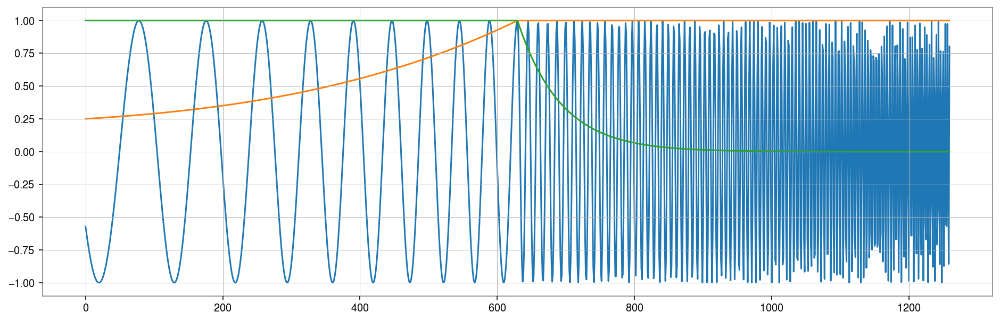

In [62]:
%matplotlib inline
N = nr_of_points

X = np.linspace(-1, 1, nr_of_points) 

# frequency boost for the second half
freq_boost = np.ones(N)
for ind, x in enumerate(freq_boost):
    if ind > N/2:
        freq_boost[ind] = 1+3*ind/N

# a cosine of increasing frequency
# start of cosine: 
soc = 2
T = np.cos(100*X*(np.exp(X/2))*freq_boost)

ramp_up = 0.2 + 1/20*(X+2)**4
ramp_up = np.where(ramp_up > 1, 1, ramp_up)


ramp_down = np.exp(-10*X) # 1/(100*X)
ramp_down = np.where(ramp_down < 0, 1, ramp_down)
ramp_down = np.where(ramp_down > 1, 1, ramp_down)

plot_width = 16
plot_height = 5

fig = plt.figure(figsize=(plot_width, plot_height))
plt.plot(T)
plt.plot(ramp_up)
plt.plot(ramp_down)

In [63]:
some_event = df["GW170104-H1"]/df["GW170104-H1"].max()

In [64]:
first_event = df.iloc[:,1]/df.iloc[:,1].max()


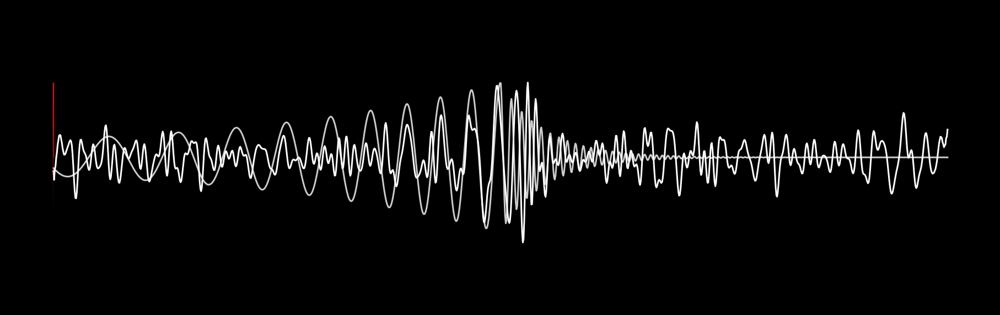

In [66]:
%matplotlib inline
plot_width = 16
plot_height = 5

fig = plt.figure(figsize=(plot_width, plot_height), facecolor=(0,0,0,1))
ax = plt.subplot(111, frameon=False)

# remove grid
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim([-2, 2])



plt.plot(ramp_up*T*ramp_down,  color=(1,1,1,0.8))
plt.plot(first_event,  color='w')
ax.fill_between(X, ramp_up*T*ramp_down, 1, zorder = 3, facecolor=(1,0,0,1) )

To create a fit for the different plots install:
https://ipywidgets.readthedocs.io/en/latest/user_install.html

and overlap the data with the plot and sliders to change the shape accordinly:
See tutorial: https://kapernikov.com/ipywidgets-with-matplotlib/

In [67]:
import ipywidgets as widgets

In [68]:
%matplotlib widget

plot_width = 10
plot_height = 5

fig = plt.figure(figsize=(plot_width, plot_height), facecolor=(0,0,0,1))
ax = plt.subplot(111, frameon=False)

ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim([-2, 2])

X = np.linspace(-1, 1, N) 

# frequency boost for the second half
freq_boost = np.ones(N)
for ind, x in enumerate(freq_boost):
    if ind > N/2:
        freq_boost[ind] = 1+3*ind/N


def my_wave(X, freq, freq_boost, ramp_i, ramp_a, ramp_d):
    """
    Return a gravitational wave
    """
    # a cosine of increasing frequency
    # start of cosine: 
    soc = 2
    T = np.cos(freq*X*(np.exp(X/2))*freq_boost)

    ramp_up = ramp_i + ramp_a*(X+2)**4
    ramp_up = np.where(ramp_up > 1, 1, ramp_up)


    ramp_down = np.exp(-ramp_d*X) # 1/(100*X)
    ramp_down = np.where(ramp_down < 0, 1, ramp_down)
    ramp_down = np.where(ramp_down > 1, 1, ramp_down)
    return T*ramp_up*ramp_down

@widgets.interact(freq=(10, 200, 10), 
                  ramp_i=(0, 1, .1), 
                  ramp_a=(0, 1, .05),
                  ramp_d=(1, 40, 1))

def update(freq = 10, ramp_i=0.1, ramp_a=0.05, ramp_d=20):
    """Remove old lines from plot and plot new one"""
    [l.remove() for l in ax.lines]
    ax.plot(X, my_wave(X, freq, freq_boost, ramp_i, ramp_a, ramp_d), color="w")

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

interactive(children=(IntSlider(value=10, description='freq', max=200, min=10, step=10), FloatSlider(value=0.1…

In [69]:
%matplotlib widget

fig, ax = plt.subplots(figsize=(6, 4))
ax.set_ylim([-4, 4])
ax.grid(True)
 
# generate x values
x = np.linspace(0, 2 * np.pi, 100)
 
 
def my_sine(x, w, amp, phi):
    """
    Return a sine for x with angular frequeny w and amplitude amp.
    """
    return amp*np.sin(w * (x-phi))
 
 
@widgets.interact(w=(0, 10, 1), amp=(0, 4, .1), phi=(0, 2*np.pi+0.01, 0.01))
def update(w = 1.0, amp=1, phi=0):
    """Remove old lines from plot and plot new one"""
    [l.remove() for l in ax.lines]
    ax.plot(x, my_sine(x, w, amp, phi))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

interactive(children=(IntSlider(value=1, description='w', max=10), FloatSlider(value=1.0, description='amp', m…

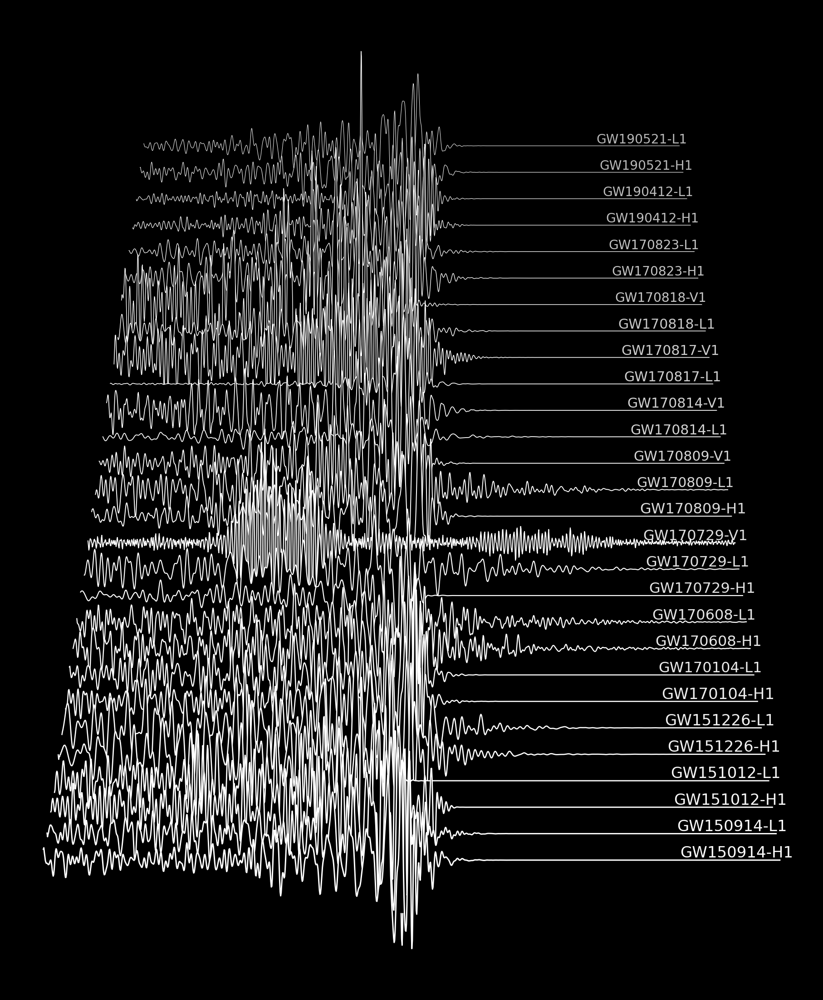

In [110]:
# Plot Size
plot_width = 16
plot_height = 20
# Fonts
csfont = {'fontname': 'Bitstream Vera Sans Mono'} # 'Capture it'} # 
# Dataset Parameters
nr_of_curves = fdf.shape[1]
nr_of_points = fdf.shape[0] # in each curve
# Drawing Parameters
lw_initial = 1.5 # initial line width
ics_factor = 10 # intercurve separation factor
# Hacks
last_y = [0]# initial value

# Create new Figure with black background
fig = plt.figure(figsize=(plot_width, plot_height), facecolor=(0,0,0,1))
ax = plt.subplot(111, frameon=False)

# remove grid
ax.set_xticks([])
ax.set_yticks([])

for ind, event_n in enumerate(fdf.columns,1):
    
    if ind > 28: # <- skip loop over this number (used to draw only subset)
        continue
    
    # Small reduction of the X extents to get a cheap perspective effect
    xscale = 1 - ind / 100.
    # Same for linewidth (thicker strokes on bottom)
    mylw = lw_initial - 1*ind / (nr_of_curves)
    #print(mylw, ind)
    
   
    y = ics_factor*ind + 1.0*fdf[event_n]
    
    if ind == 1:
        # something's up with the first curve.
        # this is a hack tomake the width work
        ax.plot(xscale * X, y, 
                color="w", 
                lw=lw_initial,
                zorder = nr_of_curves-ind)
    elif ind > 1: # and 'V1' in event_n:
        # for all other curves
        ax.plot(xscale * X, y, 
                color = "w",
                # color=(4*ind/nr_of_curves,0,1-3*ind/nr_of_curves,1)
                lw=mylw,
                zorder = nr_of_curves-ind)
    ax.text(0.73 - ind/120, np.mean(y) + 1, event_n, fontsize=int(18-ind/7), 
            color=(1,1,1,1-0.3*(ind/30)), zorder=nr_of_curves, **csfont)
    # largest zorder in the front
    if ind > 28: # <- just to fill some of them as a test
        continue
    else:
        ax.fill_between(xscale * X, y, -10, zorder = nr_of_curves-ind, facecolor=(0,0,0,1),  )
    
plt.show()
fig.savefig('plot.png', dpi=300)



In [5]:
%matplotlib widget
x = np.linspace(0, 2 * np.pi, 100)
 
fig, ax = plt.subplots()
line, = ax.plot(x, np.sin(x))
ax.grid(True)
 
def update(change):
    line.set_ydata(np.sin(change.new * x))
    fig.canvas.draw()
     
int_slider = widgets.IntSlider(
    value=1, 
    min=0, max=10, step=1,
    description='$\omega$',
    continuous_update=False
)
int_slider.observe(update, 'value')
int_slider

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

IntSlider(value=1, continuous_update=False, description='$\\omega$', max=10)

# 💀 Very exploratory & messy below this line! 💀
---

In [71]:
len(s1.value)

122880

In [73]:
half_a_sec = len(s1.value)/32*0.2 # data points in half a sec
start_of_window = int(len(s1.value)/2 - half_a_sec)
end_of_window = int(len(s1.value)/2 + half_a_sec)

ficrts0 = s1.value[start_of_window:end_of_window]
ficrts0_name = ['GW150914' for x in range(len(ficrts0))]
ficrts1 = s1.value[start_of_window:end_of_window]
ficrts1_name = ['GW151012' for x in range(len(ficrts1))]


In [ ]:
ficrts0

In [ ]:
all_data = np.vstack((ficrts0, ficrts1))
zz = np.transpose(all_data)
zz


In [ ]:
df = pd.DataFrame(zz)
df.columns = ["GW150914", "GW151012"] 


In [ ]:
df

In [ ]:
for ind, x in enumerate(df.columns):
    print(ind, x)

In [ ]:
# Create new Figure with black background
fig = plt.figure(figsize=(7, 4), facecolor=(0,0,0,1))
ax = plt.subplot(111, frameon=False)

# remove grid
ax.set_xticks([])
ax.set_yticks([])

# define data and x-axis
X = np.linspace(-1, 1, df.shape[0]) 
# Gaussian to convolute the data
G = 0.5 * np.exp(-20 * X ** 2) # a gaussian

# for the left side of the bell curve
# give it a boost
for ind, x in enumerate(G):
    if ind < len(G)/2:
        G[ind] = x+0.5
    else:
        pass


lines = []

'''
for ind, event_n in enumerate(df.columns):
    # Small reduction of the X extents to get a cheap perspective effect
    # xscale = 1 - ind / 200.
    # Same for linewidth (thicker strokes on bottom)
    # lw = 1.5 - ind / 100.0
    line, = ax.plot(xscale * X, 8e-23*ind + df[event_n], color="w", lw=lw)
    # see line 307, 
    # https://github.com/sbebo/joypy/blob/master/joypy/joyplot.py
    # ax.fill_between(xscale * X, 0.0, i + G * data[i], clip_on=True, facecolor=(0,0,0,1)) # , **kwargs)
    # ax.fill_between(xscale * X, i + G * data[i], facecolor=(0,0,0,1))
    lines.append(line)
'''

ax.plot(X, G*df["GW150914"], color="w", lw=1)
ax.fill_between(X, G*df["GW150914"], facecolor=(0,0,0,1))

ax.plot(X*0.9, 0.6e-21+G*df["GW151012"], color="w", lw=0.8)

ax.plot(X*0.8, 1.2e-21+G*df["GW150914"], color="w", lw=0.6)

ax.plot(X*0.7, 1.8e-21+G*df["GW151012"], color="w", lw=0.4)


plt.show()

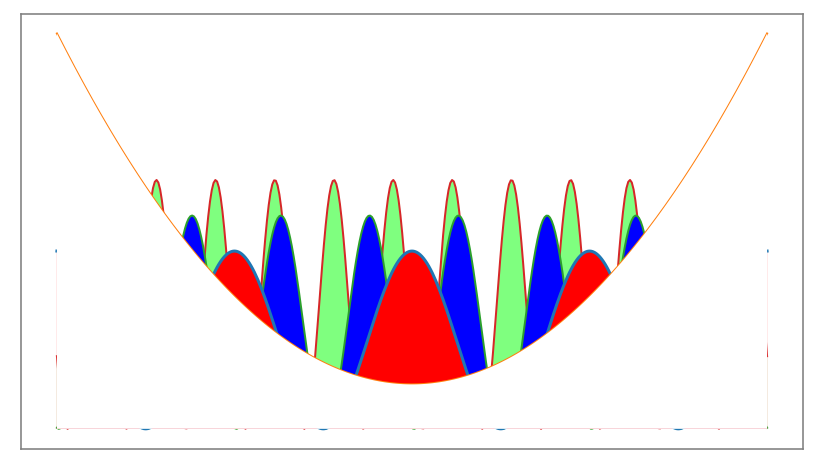

In [253]:
# Create the figure
fig = plt.figure(figsize=(7, 4))
ax = plt.subplot(111)

# remove grid
ax.set_xticks([])
ax.set_yticks([])

# define data 
X = np.linspace(-2*np.pi, 2*np.pi, 400) 

Y1 = X**2/10-0.5
Y2 = np.cos(2*X)
Y3 = 0.2+1.2*np.cos(4*X+3)
Y4 = 0.4+1.4*np.cos(6*X+2)

ax.plot(X, Y2)
ax.fill_between(X, Y1, -1, facecolor=(1,1,1,1), zorder=3)

ax.plot(X, Y1, lw=1)
ax.fill_between(X, Y2, -1, facecolor=(1,0,0,1), zorder=2)


ax.plot(X, Y3, lw=1, zorder=1)
ax.fill_between(X, Y3, -1, facecolor=(0,0,1,1), zorder=1)


ax.plot(X, Y4, lw=1, zorder=0)
ax.fill_between(X, Y4, -1, facecolor=(0,1,0,0.5), zorder=0)

plt.show()


In [ ]:
fig = plt.figure(figsize=(8, 8))

# Add a subplot with no frame
ax = plt.subplot(111) # , frameon=False)
ax.set_xticks([])
ax.set_yticks([])

x = np.arange(0.0, 2, 0.01)
y1 = np.sin(2*np.pi*x)
y2 = 1.2*np.sin(4*np.pi*x)

ax, fig = plt.subplot(111, sharex=True)

ax.plot(x,y1)
# ax.fill_between(x, y1)
ax.set_ylabel('between y1 and 0')
'''
ax.fill_between(x, y1, 1)
ax.set_ylabel('between y1 and 1')

ax3.fill_between(x, y1, y2)
ax3.set_ylabel('between y1 and y2')
ax3.set_xlabel('x')
'''

In [ ]:
# Create new Figure with black background
fig = plt.figure(figsize=(8, 8), facecolor=(0,0,0,1))

# Add a subplot with no frame
ax = plt.subplot(111, frameon=False)

# Generate random data
data = np.random.uniform(0, 1, (54, 75)) #64
# return 75 evenly spaced numbers between -1 and 1
X = np.linspace(-1, 1, data.shape[-1]) 
G = 1.5 * np.exp(-4 * X ** 2) # each row is a gaussian

# Generate line plots
lines = []
for i in range(len(data)):
    # Small reduction of the X extents to get a cheap perspective effect
    xscale = 1 - i / 200.
    # Same for linewidth (thicker strokes on bottom)
    lw = 1.5 - i / 100.0
    line, = ax.plot(xscale * X, i + G * data[i], color="w", lw=lw)
    # see line 307, 
    # https://github.com/sbebo/joypy/blob/master/joypy/joyplot.py
    ax.fill_between(xscale * X, 0.0, i + G * data[i], clip_on=True, facecolor=(0,0,0,1)) # , **kwargs)
    # ax.fill_between(xscale * X, i + G * data[i], facecolor=(0,0,0,1))
    lines.append(line)

ax.set_xticks([])
ax.set_yticks([])

plt.show()

In [ ]:
from joypy import joyplot
%matplotlib inline

fig, ax = joyplot(df)

In [ ]:
from joypy import joyplot
%matplotlib inline

# TimeSeries type error again, I think? we need to input a dataframe instead

#bp_data.to_frame()

fig, axes = joyplot(df, by="event", column="data", ylabels=False, xlabels=False, 
                          grid=False, fill=False, background='k', linecolor="w", linewidth=1,
                          legend=False, overlap=0.5, figsize=(6,5), kind="counts", bins=80)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
for a in axes[:-1]:
    a.set_xlim([-8,8])

### Seaborne Alternative plotting

see: https://seaborn.pydata.org/examples/kde_ridgeplot.html